### Student Information
Name: 張騏麟

Student ID: 111034536

GitHub ID: qilinchang70

Kaggle name:  QI LIN Chang

Kaggle private scoreboard snapshot: 

[Snapshot](img/pic0.png)

### Instructions

1. First: __This part is worth 30% of your grade.__ Do the **take home** exercises in the DM2023-Lab2-master. You may need to copy some cells from the Lab notebook to this notebook. 


2. Second: __This part is worth 30% of your grade.__ Participate in the in-class [Kaggle Competition](https://www.kaggle.com/t/09b1d0f3f8584d06848252277cb535f2) regarding Emotion Recognition on Twitter by this link https://www.kaggle.com/t/09b1d0f3f8584d06848252277cb535f2. The scoring will be given according to your place in the Private Leaderboard ranking: 
    - **Bottom 40%**: Get 20% of the 30% available for this section.

    - **Top 41% - 100%**: Get (60-x)/6 + 20 points, where x is your ranking in the leaderboard (ie. If you rank 3rd your score will be (60-3)/6 + 20 = 29.5% out of 30%)   
    Submit your last submission __BEFORE the deadline (Dec. 27th 11:59 pm, Wednesday)_. Make sure to take a screenshot of your position at the end of the competition and store it as '''pic0.png''' under the **img** folder of this repository and rerun the cell **Student Information**.
    

3. Third: __This part is worth 30% of your grade.__ A report of your work developping the model for the competition (You can use code and comment it). This report should include what your preprocessing steps, the feature engineering steps and an explanation of your model. You can also mention different things you tried and insights you gained. 


4. Fourth: __This part is worth 10% of your grade.__ It's hard for us to follow if your code is messy :'(, so please **tidy up your notebook** and **add minimal comments where needed**.


Upload your files to your repository then submit the link to it on the corresponding e-learn assignment.

Make sure to commit and save your changes to your repository __BEFORE the deadline (Dec. 31th 11:59 pm, Sunday)__. 

---
## Part 1. Take home excercise

## 1.1 Load data

We start by loading the csv files into a single pandas dataframe for training and one for testing.

In [1]:
import pandas as pd

### training data
anger_train = pd.read_csv("data/semeval/train/anger-ratings-0to1.train.txt",
                         sep="\t", header=None,names=["id", "text", "emotion", "intensity"])
sadness_train = pd.read_csv("data/semeval/train/sadness-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_train = pd.read_csv("data/semeval/train/fear-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_train = pd.read_csv("data/semeval/train/joy-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

In [2]:
# combine 4 sub-dataset
train_df = pd.concat([anger_train, fear_train, joy_train, sadness_train], ignore_index=True)

In [3]:
### testing data
anger_test = pd.read_csv("data/semeval/dev/anger-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
sadness_test = pd.read_csv("data/semeval/dev/sadness-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_test = pd.read_csv("data/semeval/dev/fear-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_test = pd.read_csv("data/semeval/dev/joy-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

# combine 4 sub-dataset
test_df = pd.concat([anger_test, fear_test, joy_test, sadness_test], ignore_index=True)
train_df.head()

,id,text,emotion,intensity
0,10000,How the fu*k! Who the heck! moved my fridge!.....,anger,0.938
1,10001,So my Indian Uber driver just called someone t...,anger,0.896
2,10002,@DPD_UK I asked for my parcel to be delivered ...,anger,0.896
3,10003,so ef whichever butt wipe pulled the fire alar...,anger,0.896
4,10004,Don't join @BTCare they put the phone down on ...,anger,0.896


In [4]:
# shuffle dataset
train_df = train_df.sample(frac=1)
test_df = test_df.sample(frac=1)

In [5]:
print("Shape of Training df: ", train_df.shape)
print("Shape of Testing df: ", test_df.shape)

Shape of Training df:  (3613, 4)
Shape of Testing df:  (347, 4)


---
### ** >>> Exercise 1 (Take home): **  
Plot word frequency for Top 30 words in both train and test dataset. (Hint: refer to DM lab 1)


In [6]:
# Answer here
from sklearn.feature_extraction.text import CountVectorizer
import nltk

vectorizer = CountVectorizer(tokenizer=nltk.word_tokenize) 
vectorizer.fit(train_df['text'])

# 特徵提取
train_features = vectorizer.transform(train_df['text'])
test_features = vectorizer.transform(test_df['text'])

feature_name = vectorizer.get_feature_names()

train_features_array=train_features.toarray()
test_features_array=test_features.toarray()

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:516: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


[[0 2 0 ... 0 0 0]
 [2 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 1 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 2 0 ... 0 0 0]]


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


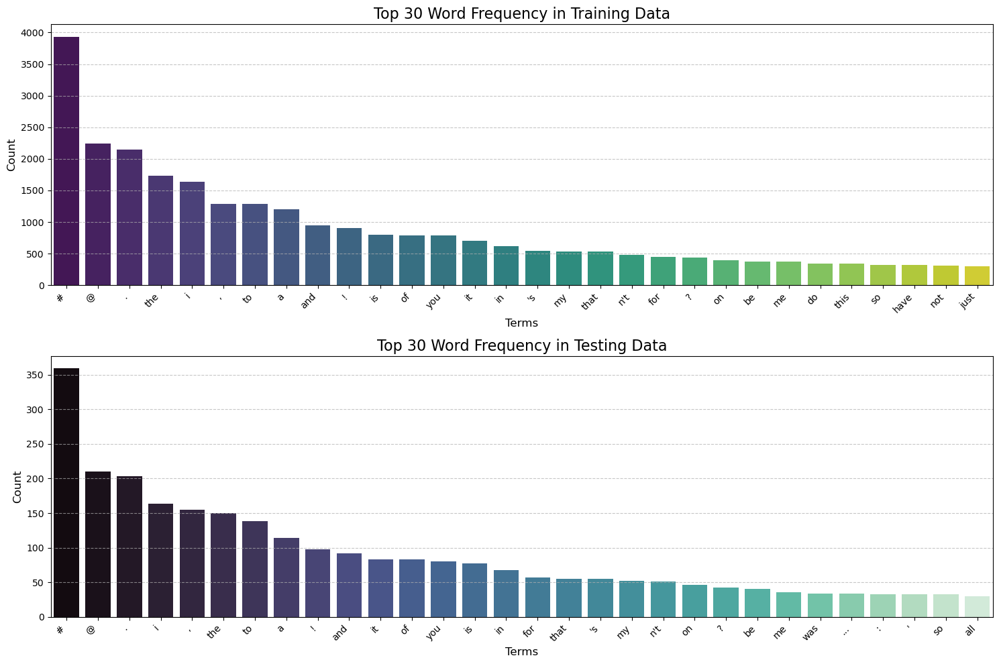

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

train_count = np.asarray(train_features_array.sum(axis=0))
df_train = pd.DataFrame(zip(train_count, feature_name), columns=['count', 'terms'])
df_train = df_train.sort_values('count', ascending=False)[:30]

test_count = np.asarray(test_features_array.sum(axis=0))
df_test = pd.DataFrame(zip(test_count, feature_name), columns=['count', 'terms'])
df_test = df_test.sort_values('count', ascending=False)[:30]

fig, axs = plt.subplots(2, 1, figsize=(15, 10))  # Changed figure size

axs[0].set_title('Top 30 Word Frequency in Training Data', fontsize=16)  # Modified titles
axs[1].set_title('Top 30 Word Frequency in Testing Data', fontsize=16)

# Changed color palette and added grid for better visibility
g1 = sns.barplot(x=df_train['terms'], y=df_train['count'], ax=axs[0], palette='viridis')
g1.set_xticklabels(df_train['terms'], rotation=45, ha='right', fontsize=10)  # Adjusted rotation and font size
g1.set_xlabel('Terms', fontsize=12)  # Added x-axis label
g1.set_ylabel('Count', fontsize=12)  # Added y-axis label
g1.grid(axis='y', linestyle='--', alpha=0.7)  # Added grid lines

g2 = sns.barplot(x=df_test['terms'], y=df_test['count'], ax=axs[1], palette='mako')  # Changed color palette
g2.set_xticklabels(df_test['terms'], rotation=45, ha='right', fontsize=10)  # Adjusted rotation and font size
g2.set_xlabel('Terms', fontsize=12)  # Added x-axis label
g2.set_ylabel('Count', fontsize=12)  # Added y-axis label
g2.grid(axis='y', linestyle='--', alpha=0.7)  # Added grid lines

plt.tight_layout()  # Adjusted layout
plt.show()

---

## 2. Feature engineering
### Using Bag of Words
Using scikit-learn ```CountVectorizer``` perform word frequency and use these as features to train a model.  
http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

In [13]:
from sklearn.feature_extraction.text import CountVectorizer

In [14]:
# build analyzers (bag-of-words)
BOW_vectorizer = CountVectorizer() 

In [15]:
# 1. Learn a vocabulary dictionary of all tokens in the raw documents.
BOW_vectorizer.fit(train_df['text'])

# 2. Transform documents to document-term matrix.
train_data_BOW_features = BOW_vectorizer.transform(train_df['text'])
test_data_BOW_features = BOW_vectorizer.transform(test_df['text'])

In [16]:
# check the result
train_data_BOW_features

<3613x10115 sparse matrix of type '<class 'numpy.int64'>'
	with 51467 stored elements in Compressed Sparse Row format>

In [17]:
type(train_data_BOW_features)

scipy.sparse.csr.csr_matrix

In [18]:
# add .toarray() to show
train_data_BOW_features.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [19]:
# check the dimension
train_data_BOW_features.shape

(3613, 10115)

In [20]:
# observe some feature names
feature_names = BOW_vectorizer.get_feature_names_out()
feature_names[100:110]

array(['2k17', '2much', '2nd', '30', '300', '301', '30am', '30pm', '30s',
       '31'], dtype=object)

The embedding is done. We can technically feed this into our model. However, depending on the embedding technique you use and your model, your accuracy might not be as high, because:

* curse of dimensionality  (we have 10,115 dimension now)
* some important features are ignored (for example, some models using emoticons yeld better performance than counterparts)

In [21]:
"😂" in feature_names

False

Let's try using another tokenizer below.

In [22]:
import nltk

# build analyzers (bag-of-words)
BOW_500 = CountVectorizer(max_features=500, tokenizer=nltk.word_tokenize) 

# apply analyzer to training data
BOW_500.fit(train_df['text'])

train_data_BOW_features_500 = BOW_500.transform(train_df['text'])

## check dimension
train_data_BOW_features_500.shape

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:516: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(3613, 500)

In [23]:
train_data_BOW_features_500.toarray()

array([[0, 2, 0, ..., 0, 0, 0],
       [2, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 2, 0, ..., 0, 0, 0]], dtype=int64)

In [24]:
# observe some feature names
feature_names_500 = BOW_500.get_feature_names_out()
feature_names_500[100:110]

array(['change', 'cheer', 'cheerful', 'cheerfully', 'cheering', 'cheery',
       'come', 'comes', 'could', 'country'], dtype=object)

In [25]:
"😂" in feature_names_500

True

---
### ** >>> Exercise 2 (Take home): **  
Generate an embedding using the TF-IDF vectorizer instead of th BOW one with 1000 features and show the feature names for features [100:110].

In [29]:
# Answer here
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000,tokenizer=nltk.word_tokenize)
tfidf_train = tfidf_vectorizer.fit_transform(train_df['text'])

feature_names_1000 = tfidf_vectorizer.get_feature_names_out()
feature_names_1000[100:110]

array(['awful', 'b', 'baby', 'back', 'bad', 'ball', 'balls', 'bb18', 'bc',
       'bday'], dtype=object)

---
## 3. Model
### 3.1 Decision Trees
Using scikit-learn ```DecisionTreeClassifier``` performs word frequency and uses these as features to train a model.  
http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier

In [30]:
from sklearn.tree import DecisionTreeClassifier

# for a classificaiton problem, you need to provide both training & testing data
X_train = BOW_500.transform(train_df['text'])
y_train = train_df['emotion']

X_test = BOW_500.transform(test_df['text'])
y_test = test_df['emotion']

## take a look at data dimension is a good habit  :)
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (3613, 500)
y_train.shape:  (3613,)
X_test.shape:  (347, 500)
y_test.shape:  (347,)


In [31]:
## build DecisionTree model
DT_model = DecisionTreeClassifier(random_state=1)

## training!
DT_model = DT_model.fit(X_train, y_train)

## predict!
y_train_pred = DT_model.predict(X_train)
y_test_pred = DT_model.predict(X_test)

## so we get the pred result
y_test_pred[:10]

array(['fear', 'joy', 'fear', 'anger', 'fear', 'fear', 'anger', 'fear',
       'sadness', 'fear'], dtype=object)

---
## 4. Results Evaluation

Now we will check the results of our model's performance

In [32]:
## accuracy
from sklearn.metrics import accuracy_score

acc_train = accuracy_score(y_true=y_train, y_pred=y_train_pred)
acc_test = accuracy_score(y_true=y_test, y_pred=y_test_pred)

print('training accuracy: {}'.format(round(acc_train, 2)))
print('testing accuracy: {}'.format(round(acc_test, 2)))


training accuracy: 0.99
testing accuracy: 0.68


In [33]:
## precision, recall, f1-score,
from sklearn.metrics import classification_report

print(classification_report(y_true=y_test, y_pred=y_test_pred))

              precision    recall  f1-score   support

       anger       0.66      0.68      0.67        84
        fear       0.66      0.69      0.67       110
         joy       0.72      0.71      0.71        79
     sadness       0.70      0.64      0.67        74

    accuracy                           0.68       347
   macro avg       0.68      0.68      0.68       347
weighted avg       0.68      0.68      0.68       347



In [34]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true=y_test, y_pred=y_test_pred) 
print(cm)

[[57 18  6  3]
 [16 76  9  9]
 [ 6  9 56  8]
 [ 7 13  7 47]]


In [35]:
# Funciton for visualizing confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion matrix',
                          cmap=sns.cubehelix_palette(as_cmap=True)):
    """
    This function is modified from: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    """
    classes.sort()
    tick_marks = np.arange(len(classes))    
    
    fig, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels = classes,
           yticklabels = classes,
           title = title,
           xlabel = 'True label',
           ylabel = 'Predicted label')

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
    ylim_top = len(classes) - 0.5
    plt.ylim([ylim_top, -.5])
    plt.tight_layout()
    plt.show()

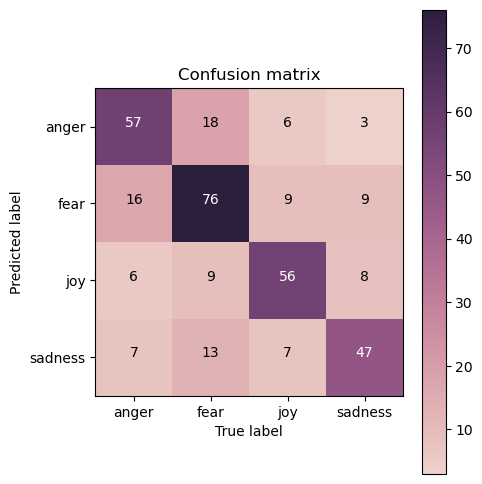

In [36]:
# plot your confusion matrix
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm, classes=my_tags, title='Confusion matrix')

---
### ** >>> Exercise 3 (Take home): **  
Can you interpret the results above? What do they mean?

Observation :
1. 錯誤預測中， anger較容易被預測成fear，且fear被錯誤預測成anger之比例較高，故這兩個類別「可能」較容易混淆
2. joy 之錯誤預測的比例較平均

Improvment :
1. 使用Word2Vec 捕捉單詞之間的語義信息
2. 資料平衡，讓每個類別的資料量是一致的
3. 利用擅長處理NLP的深度學習模型，如BERT、LSTM等模型。

---
### ** >>> Exercise 4 (Take home): **  
Build a model using a ```Naive Bayes``` model and train it. What are the testing results? 

*Reference*: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html

In [38]:
# Answer here
from sklearn.naive_bayes import MultinomialNB

#Naive Bayes model
NB_model = MultinomialNB()
NB_model.fit(X_train, y_train)

#predict
y_train_pred_NB=NB_model.predict(X_train)
y_test_pred_NB=NB_model.predict(X_test)

In [46]:
#evaluation
acc_train_NB = accuracy_score(y_true=y_train, y_pred=y_train_pred_NB)
acc_test_NB = accuracy_score(y_true=y_test, y_pred=y_test_pred_NB)

print('training accuracy: {}'.format(round(acc_train_NB, 2)))
print('testing accuracy: {}'.format(round(acc_test_NB, 2)))

training accuracy: 0.79
testing accuracy: 0.7


In [39]:
#precision, recall, f1-score, support for training data

from sklearn.metrics import classification_report
print(classification_report(y_true=y_train, y_pred=y_train_pred_NB))

              precision    recall  f1-score   support

       anger       0.77      0.80      0.78       857
        fear       0.78      0.81      0.79      1147
         joy       0.87      0.80      0.83       823
     sadness       0.76      0.75      0.76       786

    accuracy                           0.79      3613
   macro avg       0.79      0.79      0.79      3613
weighted avg       0.79      0.79      0.79      3613



In [40]:
## precision, recall, f1-score for test data
print(classification_report(y_true=y_test, y_pred=y_test_pred_NB))

              precision    recall  f1-score   support

       anger       0.63      0.65      0.64        84
        fear       0.73      0.77      0.75       110
         joy       0.78      0.71      0.74        79
     sadness       0.64      0.62      0.63        74

    accuracy                           0.70       347
   macro avg       0.70      0.69      0.69       347
weighted avg       0.70      0.70      0.70       347



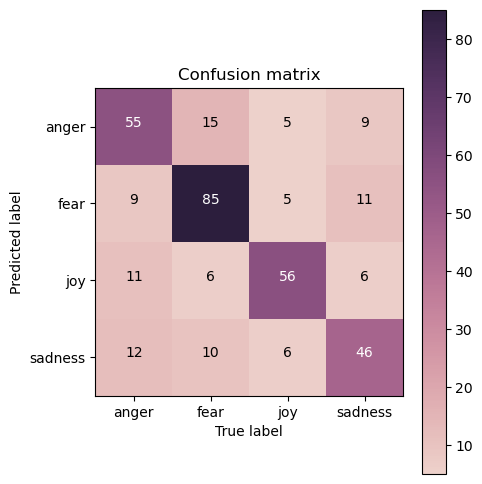

In [44]:
cm_NB = confusion_matrix(y_true=y_test, y_pred=y_test_pred_NB) 

# plot confusion matrix
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm_NB, classes=my_tags, title='Confusion matrix')

---
### ** >>> Exercise 5 (Take home): **  

How do the results from the Naive Bayes model and the Decision Tree model compare? How do you interpret these differences? Use the theoretical background covered in class to try and explain these differences.

||Decision Tree | Naive Bayes |
|-----|-----|-----|
|train acc.| 0.99  | 0.79   |
|test acc. | 0.68   | 0.7   |

### Interpretation :

Decision Tree模型：

    1. 訓練準確度高（0.99）： 訓練集上表現非常好，準確度接近於1。
       可能是因為其能夠靈活地適應訓練資料，甚至可以捕捉資料中的噪聲或細微的關係等等。

    2. 測試準確度相對較低（0.68）： 訓練集上準確度接近於1，但測試準確度相對較低，表示可能存在過擬合。
       可能是因為其在訓練時過於複雜，記住了訓練資料的細節而失去了泛化能力。

Naive Bayes模型：

    1. 訓練準確度較低（0.79）： Naive Bayes在訓練集上的表現較Decision Tree差，
       可能是因為它對特徵之間的獨立性作了強烈的假設，而實際資料中的特徵可能存在某些相關性。

    2. 測試準確度相對較高（0.7）： 相對於Decision Tree，Naive Bayes在測試集上的表現較好，
       可能表明它對於未見過的資料有較好的泛化能力。其通常對於高維度的資料和文本分類任務有良好的表現。

---
## 6. Deep Learning

We use [Keras](https://keras.io/) to be our deep learning framwork, and follow the [Model (functional API)](https://keras.io/models/model/) to build a Deep Neural Network (DNN) model. Keras runs with Tensorflow in the backend. It's a nice abstraction to start working with NN models. 

Because Deep Learning is a 1-semester course, we can't talk about each detail about it in the lab session. Here, we only provide a simple template about how to build & run a DL model successfully. You can follow this template to design your model.

We will begin by building a fully connected network, which looks like this:

### 6.1 Prepare data (X, y)

In [47]:
import keras

# standardize name (X, y) 
X_train = BOW_500.transform(train_df['text'])
y_train = train_df['emotion']

X_test = BOW_500.transform(test_df['text'])
y_test = test_df['emotion']

## check dimension is a good habbit 
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (3613, 500)
y_train.shape:  (3613,)
X_test.shape:  (347, 500)
y_test.shape:  (347,)


### 6.2 Deal with categorical label (y)

Rather than put your label `train_df['emotion']` directly into a model, we have to process these categorical (or say nominal) label by ourselves. 

Here, we use the basic method [one-hot encoding](https://en.wikipedia.org/wiki/One-hot) to transform our categorical  labels to numerical ones.


In [48]:
## deal with label (string -> one-hot)

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
label_encoder.fit(y_train)
print('check label: ', label_encoder.classes_)
print('\n## Before convert')
print('y_train[0:4]:\n', y_train[0:4])
print('\ny_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)

def label_encode(le, labels):
    enc = le.transform(labels)
    return keras.utils.to_categorical(enc)

def label_decode(le, one_hot_label):
    dec = np.argmax(one_hot_label, axis=1)
    return le.inverse_transform(dec)

y_train = label_encode(label_encoder, y_train)
y_test = label_encode(label_encoder, y_test)

print('\n\n## After convert')
print('y_train[0:4]:\n', y_train[0:4])
print('\ny_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)


check label:  ['anger' 'fear' 'joy' 'sadness']

## Before convert
y_train[0:4]:
 2431        joy
2169        joy
3591    sadness
191       anger
Name: emotion, dtype: object

y_train.shape:  (3613,)
y_test.shape:  (347,)


## After convert
y_train[0:4]:
 [[0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]]

y_train.shape:  (3613, 4)
y_test.shape:  (347, 4)


### 6.3 Build model

In [49]:
# I/O check
input_shape = X_train.shape[1]
print('input_shape: ', input_shape)

output_shape = len(label_encoder.classes_)
print('output_shape: ', output_shape)

input_shape:  500
output_shape:  4


![Imgur](pics/pic2.png)

In [50]:
from keras.models import Model
from keras.layers import Input, Dense
from keras.layers import ReLU, Softmax

# input layer
model_input = Input(shape=(input_shape, ))  # 500
X = model_input

# 1st hidden layer
X_W1 = Dense(units=64)(X)  # 64
H1 = ReLU()(X_W1)

# 2nd hidden layer
H1_W2 = Dense(units=64)(H1)  # 64
H2 = ReLU()(H1_W2)

# output layer
H2_W3 = Dense(units=output_shape)(H2)  # 4
H3 = Softmax()(H2_W3)

model_output = H3

# create model
model = Model(inputs=[model_input], outputs=[model_output])

# loss function & optimizer
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# show model construction
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 500)]             0         
                                                                 
 dense (Dense)               (None, 64)                32064     
                                                                 
 re_lu (ReLU)                (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 64)                4160      
                                                                 
 re_lu_1 (ReLU)              (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 4)                 260       
                                                                 
 softmax (Softmax)           (None, 4)                 0     

### 6.4 Train

In [51]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('logs/training_log.csv')

# training setting
epochs = 25
batch_size = 32

# training!
history = model.fit(X_train, y_train, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    callbacks=[csv_logger],
                    validation_data = (X_test, y_test))
print('training finish')

Epoch 1/25


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/model/dense/embedding_lookup_sparse/Reshape_1:0", shape=(None,), dtype=int32), values=Tensor("gradient_tape/model/dense/embedding_lookup_sparse/Reshape:0", shape=(None, 64), dtype=float32), dense_shape=Tensor("gradient_tape/model/dense/embedding_lookup_sparse/Cast:0", shape=(2,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(


113/113 [==============================] - 2s 9ms/step - loss: 1.3301 - accuracy: 0.3653 - val_loss: 1.2920 - val_accuracy: 0.4899
Epoch 2/25
113/113 [==============================] - 1s 5ms/step - loss: 1.0017 - accuracy: 0.6452 - val_loss: 0.9618 - val_accuracy: 0.6398
Epoch 3/25
113/113 [==============================] - 0s 4ms/step - loss: 0.5926 - accuracy: 0.7830 - val_loss: 0.8502 - val_accuracy: 0.6888
Epoch 4/25
113/113 [==============================] - 0s 4ms/step - loss: 0.4256 - accuracy: 0.8409 - val_loss: 0.7953 - val_accuracy: 0.7176
Epoch 5/25
113/113 [==============================] - 1s 5ms/step - loss: 0.3327 - accuracy: 0.8810 - val_loss: 0.8540 - val_accuracy: 0.7032
Epoch 6/25
113/113 [==============================] - 0s 4ms/step - loss: 0.2749 - accuracy: 0.9056 - val_loss: 0.8651 - val_accuracy: 0.6744
Epoch 7/25
113/113 [==============================] - 0s 3ms/step - loss: 0.2292 - accuracy: 0.9247 - val_loss: 0.9035 - val_accuracy: 0.6916
Epoch 8/25
113/11

### 6.5 Predict on testing data

In [52]:
## predict
pred_result = model.predict(X_test, batch_size=128)
pred_result[:5]

3/3 [==============================] - 0s 3ms/step


array([[2.97480028e-06, 9.98021603e-01, 3.76700182e-09, 1.97536964e-03],
       [1.53647433e-03, 3.14906458e-07, 9.97611940e-01, 8.51206074e-04],
       [2.05661581e-05, 9.99268532e-01, 5.49591641e-05, 6.55971875e-04],
       [6.87325418e-01, 2.11267710e-01, 5.31081110e-02, 4.82988209e-02],
       [1.09072635e-02, 9.19538140e-01, 3.58785652e-02, 3.36759388e-02]],
      dtype=float32)

In [53]:
pred_result = label_decode(label_encoder, pred_result)
pred_result[:5]

array(['fear', 'joy', 'fear', 'anger', 'fear'], dtype=object)

In [54]:
from sklearn.metrics import accuracy_score

print('testing accuracy: {}'.format(round(accuracy_score(label_decode(label_encoder, y_test), pred_result), 2)))

testing accuracy: 0.66


In [55]:
#Let's take a look at the training log
training_log = pd.DataFrame()
training_log = pd.read_csv("logs/training_log.csv")
training_log

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.365347,1.330096,0.489914,1.291978
1,1,0.645170,1.001739,0.639769,0.961802
2,2,0.783006,0.592635,0.688761,0.850200
3,3,0.840852,0.425599,0.717579,0.795269
4,4,0.880985,0.332715,0.703170,0.853979
5,5,0.905619,0.274914,0.674352,0.865122
6,6,0.924716,0.229195,0.691643,0.903491
7,7,0.939109,0.190178,0.662824,0.972689
8,8,0.948796,0.167840,0.674352,1.008861
9,9,0.958206,0.147031,0.677233,1.062778


---
### ** >>> Exercise 6 (Take home): **  

Plot the Training and Validation Accuracy and Loss (different plots), just like the images below.(Note: the pictures below are an example from a different model). How to interpret the graphs you got? How are they related to the concept of overfitting/underfitting covered in class?
<table><tr>
    <td><img src="pics/pic3.png" style="width: 300px;"/> </td>
    <td><img src="pics/pic4.png" style="width: 300px;"/> </td>
</tr></table>

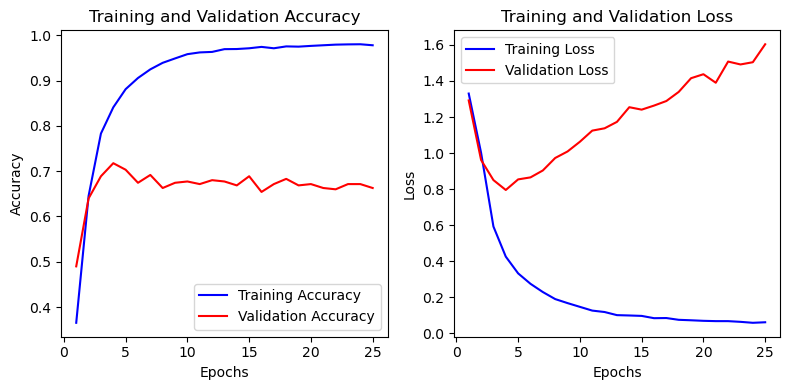

In [57]:
# Answer here
import matplotlib.pyplot as plt

# 從 training log 中提取資訊
train_acc = training_log['accuracy']
val_acc = training_log['val_accuracy']
train_loss = training_log['loss']
val_loss = training_log['val_loss']
epochs = range(1, len(train_acc) + 1)

# 畫Accuracy曲線
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs, train_acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# 畫Loss曲線
plt.subplot(1, 2, 2)
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

由圖可知，隨著training accuracy越來越高，其loss亦隨之降低；然而，大概在第五個epoch後，validation loss反而越來越高，即出現"overfitting"。

---
### ** >>> Exercise 7 (Take home): **  

Now, we have the word vectors, but our input data is a sequence of words (or say sentence). 
How can we utilize these "word" vectors to represent the sentence data and train our model?


1. Average： 將整個句子中所有詞向量進行平均，得到一個句子向量。

2. Sum： 將整個句子中所有詞向量進行加總，得到一個句子向量。

2. Weighted Average： 為每個詞向量分配一個權重，然後計算加權平均值。權重可以根據詞的重要性進行調整，如 TF-IDF 分數。

3. Doc2Vec : 是一種用於將文本表示為向量的技術，允許將整個文本或段落mapping到固定維度的向量空間中。


## 9. High-dimension Visualization: t-SNE

No matter if you use the Bag-of-words, TF-IDF, or Word2Vec, it's very hard to see the embedding result, because the dimension is larger than 3.  

In Lab 1, we already talked about PCA. We can use PCA to reduce the dimension of our data, then visualize it. However, if you dig deeper into the result, you'd find it is insufficient.

Our aim will be to create a visualization similar to the one below:

![Image](pics/pic7.png)
source: https://www.fabian-keller.de/research/high-dimensional-data-visualization 

Here we would like to introduce another visualization method called t-SNE.  
http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html 

### 9.1 Prepare visualizing target

Let's prepare data lists like:
- happy words
- angry words
- data words
- mining words

In [74]:
word_list = ['happy', 'angry', 'data', 'mining']

topn = 5
happy_words = ['happy'] + [word_ for word_, sim_ in w2v_google_model.most_similar('happy', topn=topn)]
angry_words = ['angry'] + [word_ for word_, sim_ in w2v_google_model.most_similar('angry', topn=topn)]        
data_words = ['data'] + [word_ for word_, sim_ in w2v_google_model.most_similar('data', topn=topn)]        
mining_words = ['mining'] + [word_ for word_, sim_ in w2v_google_model.most_similar('mining', topn=topn)]        

print('happy_words: ', happy_words)
print('angry_words: ', angry_words)
print('data_words: ', data_words)
print('mining_words: ', mining_words)

target_words = happy_words + angry_words + data_words + mining_words
print('\ntarget words: ')
print(target_words)

print('\ncolor list:')
cn = topn + 1
color = ['b'] * cn + ['g'] * cn + ['r'] * cn + ['y'] * cn
print(color)

happy_words:  ['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled']
angry_words:  ['angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed']
data_words:  ['data', 'Data', 'datasets', 'dataset', 'databases', 'statistics']
mining_words:  ['mining', 'Mining', 'mines', 'coal_mining', 'mine', 'miner']

target words: 
['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled', 'angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed', 'data', 'Data', 'datasets', 'dataset', 'databases', 'statistics', 'mining', 'Mining', 'mines', 'coal_mining', 'mine', 'miner']

color list:
['b', 'b', 'b', 'b', 'b', 'b', 'g', 'g', 'g', 'g', 'g', 'g', 'r', 'r', 'r', 'r', 'r', 'r', 'y', 'y', 'y', 'y', 'y', 'y']


### 9.2 Plot using t-SNE (2-dimension)

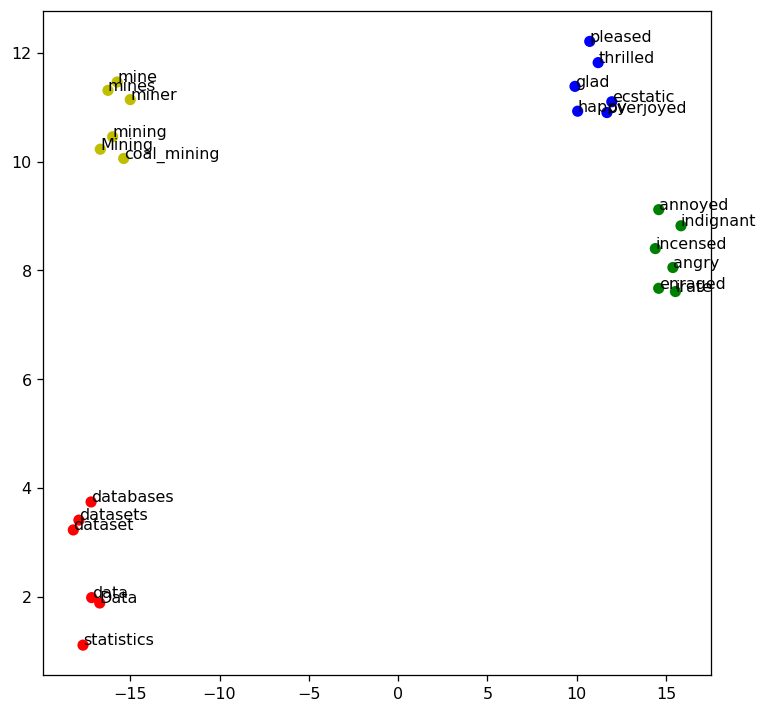

In [75]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

## w2v model
model = w2v_google_model

## prepare training word vectors
size = 200
target_size = len(target_words)
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

## t-SNE model
tsne = TSNE(n_components=2, metric='cosine', random_state=28)

## training
X_tsne = tsne.fit_transform(X_train)

## plot the result
plt.figure(figsize=(7.5, 7.5), dpi=115)
plt.scatter(X_tsne[:target_size, 0], X_tsne[:target_size, 1], c=color)
for label, x, y in zip(target_words, X_tsne[:target_size, 0], X_tsne[:target_size, 1]):
    plt.annotate(label, xy=(x,y), xytext=(0,0),  textcoords='offset points')
plt.show()

---
### ** >>> Exercise 8 (Take home): **  

Generate a t-SNE visualization to show the 15 words most related to the words "angry", "happy", "sad", "fear" (60 words total).

In [77]:
# Answer here
word_list = ['angry','happy','sad', 'fear']

topn = 15
angry_words = ['angry'] + [word_ for word_, sim_ in w2v_google_model.most_similar('angry', topn=topn)]
happy_words = ['happy'] + [word_ for word_, sim_ in w2v_google_model.most_similar('happy', topn=topn)]        
sad_words = ['sad'] + [word_ for word_, sim_ in w2v_google_model.most_similar('sad', topn=topn)]        
fear_words = ['fear'] + [word_ for word_, sim_ in w2v_google_model.most_similar('fear', topn=topn)]        

print('angry_words: ', angry_words)
print('happy_words: ', happy_words)
print('sad_words: ', sad_words)
print('fear_words: ', fear_words)

target_words = angry_words + happy_words + sad_words + fear_words
print('\ntarget words: ')
print(target_words)

print('\ncolor list:')
cn = topn + 1
color = ['b'] * cn + ['g'] * cn + ['r'] * cn + ['y'] * cn
print(color)

angry_words:  ['angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed', 'agitated', 'frustrated', 'furious', 'unhappy', 'outraged', 'livid', 'irritated', 'exasperated', 'angrier', 'Angry']
happy_words:  ['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled', 'satisfied', 'proud', 'delighted', 'disappointed', 'excited', 'happier', 'Said_Hirschbeck', 'elated', 'thankful', 'unhappy']
sad_words:  ['sad', 'saddening', 'Sad', 'saddened', 'heartbreaking', 'disheartening', 'Meny_Friedman', 'parishioner_Pat_Patello', 'saddens_me', 'distressing', 'reminders_bobbing', 'Turkoman_Shiites', 'saddest', 'unfortunate', 'sorry', 'bittersweet']
fear_words:  ['fear', 'fearful', 'fears', 'Fear', 'fearing', 'worry', 'dread', 'feared', 'anxiety', 'apprehension', 'afraid', 'worries', 'concern', 'distrust', 'worried', 'Fearful']

target words: 
['angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed', 'agitated', 'frustrated', 'furious', 'unhappy', 'outraged', 'livid', 'irritated', 'e

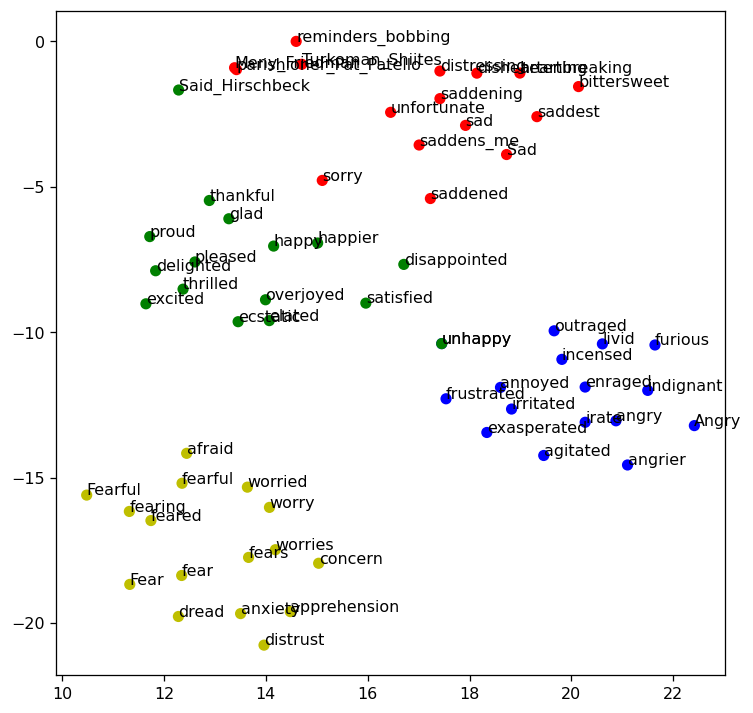

In [78]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

## w2v model
model = w2v_google_model

## prepare training word vectors
size = 200
target_size = len(target_words)
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

## t-SNE model
tsne = TSNE(n_components=2, metric='cosine', random_state=28)

## training
X_tsne = tsne.fit_transform(X_train)

## plot the result
plt.figure(figsize=(7.5, 7.5), dpi=115)
plt.scatter(X_tsne[:target_size, 0], X_tsne[:target_size, 1], c=color)
for label, x, y in zip(target_words, X_tsne[:target_size, 0], X_tsne[:target_size, 1]):
    plt.annotate(label, xy=(x,y), xytext=(0,0),  textcoords='offset points')
plt.show()

---

# Part 2.  Kaggle Competition Result

Kaggle name: QI LIN Chang

Kaggle private scoreboard snapshot:

[Snapshot](img/pic0.png)

---

# Part 3.  Report

### 1. Data Pre-processing

In [1]:
#Load data
import pandas as pd

df_id = pd.read_csv("tweet_data/data_identification.csv")
df_emo = pd.read_csv("tweet_data/emotion.csv")

In [2]:
# pre-processing for json

import json

id_lst, text_lst, score_lst = [],[],[]

with open(r'tweet_data/tweets_DM.json','r') as f:
    lst=f.readlines()
    for data_json in lst:
        data=json.loads(data_json)
        id_lst.append(data['_source']['tweet']['tweet_id'])
        text_lst.append(data['_source']['tweet']['text'])
        score_lst.append(data['_score'])

data_tweet={"tweet_id":id_lst,"text":text_lst,"score":score_lst}
df_all=pd.DataFrame(data_tweet)


df_all.head()

,tweet_id,text,score
0,0x376b20,"People who post ""add me on #Snapchat"" must be ...",391
1,0x2d5350,"@brianklaas As we see, Trump is dangerous to #...",433
2,0x28b412,"Confident of your obedience, I write to you, k...",232
3,0x1cd5b0,Now ISSA is stalking Tasha 😂😂😂 <LH>,376
4,0x2de201,"""Trust is not the same as faith. A friend is s...",989


In [ ]:
#Merge data frame

df_all=pd.merge(df_all,df_id,on='tweet_id',how='outer')
df_all= pd.merge(df_all,df_emo,on='tweet_id',how= 'outer')
df_all.head()  

,tweet_id,text,score,identification,emotion
0,0x376b20,"People who post ""add me on #Snapchat"" must be ...",391,train,anticipation
1,0x2d5350,"@brianklaas As we see, Trump is dangerous to #...",433,train,sadness
2,0x28b412,"Confident of your obedience, I write to you, k...",232,test,NaN
3,0x1cd5b0,Now ISSA is stalking Tasha 😂😂😂 <LH>,376,train,fear
4,0x2de201,"""Trust is not the same as faith. A friend is s...",989,test,NaN


In [ ]:
import nltk
# Download WordNet and stopwords data from NLTK
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')

# Import necessary libraries
from nltk.corpus import stopwords
import regex as re
from nltk.stem import WordNetLemmatizer

# Load stopwords for English
stopwords_english = stopwords.words('english')

# Initialize WordNet lemmatizer
lemmatizer = WordNetLemmatizer()

# Clean and preprocess text data
clean_txt = []

# Loop through each text in the 'text' column of the DataFrame
for text in list(df_all['text']):
    # Remove unwanted characters like "<", ">", '"', "'", ".", and ","
    text = re.sub('[<LH>"\'.,]', '', text)
    # Remove Twitter handles (user mentions) starting with '@'
    text = re.sub('@\\w+ *', '', text)
    # Convert text to lowercase
    text = text.lower()
    # Tokenize the text
    text = text.split()
    # Lemmatize each word and remove stopwords
    text = [lemmatizer.lemmatize(word) for word in text if not word in set(stopwords_english)]
    # Join the lemmatized words back into a string
    text = ' '.join(text)
    # Append the preprocessed text to the clean_txt list
    clean_txt.append(text)

# Update the 'text' column in the DataFrame with the preprocessed text
df_all['text'] = clean_txt


[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
#save dataframe
df_all.to_csv('D:/DM2023-Lab2-Master-main/Homework/tweet_data/df_all.csv')

In [ ]:
import pandas as pd

df_all=pd.read_csv('D:/DM2023-Lab2-Master-main/Homework/tweet_data/df_all.csv')
df_all.drop(['Unnamed: 0'],axis=1,inplace=True)
df_all

,tweet_id,text,score,identification,emotion
0,0x376b20,people post add #snapchat must dehydrated cuz ...,391,train,anticipation
1,0x2d5350,see trump dangerous #freepress around world #t...,433,train,sadness
2,0x28b412,confident obedience write knowing even ask (ph...,232,test,NaN
3,0x1cd5b0,issa stalking tasha 😂😂😂,376,train,fear
4,0x2de201,trust faith friend someone trust putting faith...,989,test,NaN
...,...,...,...,...,...
1867530,0x316b80,buy last 2 ticket remaining show sell #mixedfe...,827,test,NaN
1867531,0x29d0cb,swear hard work gone pay one day😈💰💸,368,test,NaN
1867532,0x2a6a4f,card left wasnt idea get parcel,498,test,NaN
1867533,0x24faed,ah corporate life date using relative anachron...,840,train,joy


### 2. Sentence Embedding

In [5]:
#Using Bert model to do embedding

from transformers import BertTokenizer, BertModel
import torch
import torch.nn as nn

model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
bert_model = BertModel.from_pretrained(model_name)

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

C:\Users\User\AppData\Roaming\Python\Python39\site-packages\huggingface_hub\file_download.py:149: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\User\.cache\huggingface\hub\models--bert-base-uncased. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [ ]:
sentences = df_all['text'].values.tolist()
sentences

['people post add #snapchat must dehydrated cuz man thats',
 'see trump dangerous #freepress around world #trumpegacy #cnn',
 'confident obedience write knowing even ask (philemon 1:21) 3/4 #bibleverse',
 'issa stalking tasha 😂😂😂',
 'trust faith friend someone trust putting faith anyone mistake ~ christopher itchens',
 'thx best time tonight stories! eartbreakingly #authentic #aughoutoud good!!',
 'still waiting supply iscus',
 'ove know gender 😢😭',
 'highlight shown actual sports! watch triathlon highlight anyway? #eaguecup',
 'enough ? satisfied ? goal really money ? #materialism #money #possessions',
 '#ssm debate; (a manufactured fantasy used distract ignorant mass mundane lives) v #gender #diversity (a',
 'love suffering 🙃🙃 love valium nothing help 🙃🙃 love doctor say theyve done 🙃🙃',
 'someone tell feed scroll back 30 tweet saw 1 min ago? #pissed!',
 'know research butterfly predictive text autocorrects butterfly #justgradstudentthings #ecology',
 'brother didnt tell going horror 

In [ ]:
#Deal with emoji

import emoji

sentences = [str(sentence) for sentence in sentences]
sentences_demoji = [emoji.demojize(sentence) for sentence in sentences]
sentences_demoji

['people post add #snapchat must dehydrated cuz man thats',
 'see trump dangerous #freepress around world #trumpegacy #cnn',
 'confident obedience write knowing even ask (philemon 1:21) 3/4 #bibleverse',
 'issa stalking tasha :face_with_tears_of_joy::face_with_tears_of_joy::face_with_tears_of_joy:',
 'trust faith friend someone trust putting faith anyone mistake ~ christopher itchens',
 'thx best time tonight stories! eartbreakingly #authentic #aughoutoud good!!',
 'still waiting supply iscus',
 'ove know gender :crying_face::loudly_crying_face:',
 'highlight shown actual sports! watch triathlon highlight anyway? #eaguecup',
 'enough ? satisfied ? goal really money ? #materialism #money #possessions',
 '#ssm debate; (a manufactured fantasy used distract ignorant mass mundane lives) v #gender #diversity (a',
 'love suffering :upside-down_face::upside-down_face: love valium nothing help :upside-down_face::upside-down_face: love doctor say theyve done :upside-down_face::upside-down_face:'

In [ ]:
# Tokenize and encode sentences using the provided tokenizer

input_ids, attention_masks = [], []

for sent in sentences_demoji:
    # Encode the sentence using the tokenizer
    encoded_sent = tokenizer.encode_plus(
                        sent,                     
                        add_special_tokens=True,
                        max_length=64,           
                        pad_to_max_length=True,
                        return_attention_mask=True,  
                        return_tensors='pt',    
                   )
    
    # Append the encoded input_ids and attention_masks to their respective lists
    input_ids.append(encoded_sent['input_ids'])
    attention_masks.append(encoded_sent['attention_mask'])

# Concatenate the lists of input_ids and attention_masks into tensors
input_ids = torch.cat(input_ids, dim=0)
attention_masks = torch.cat(attention_masks, dim=0)


/home/ql/anaconda3/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:2418: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [ ]:
# Set the device to CUDA (GPU) for faster computation if available
device = torch.device("cuda") 

# Define the batch size
batch_size = 32

# Split the input_ids and attention_masks into batches
input_id_batches = [input_ids[i:i+batch_size] for i in range(0, len(input_ids), batch_size)]
attention_mask_batches = [attention_masks[i:i+batch_size] for i in range(0, len(attention_masks), batch_size)]

bert_model = bert_model.to(device)


In [ ]:
encoded_batches = []

for input_ids, attention_masks in zip(input_id_batches, attention_mask_batches):
    
    input_ids = input_ids.to(device)
    attention_masks = attention_masks.to(device) 
    
    # Perform forward pass through the BERT model with no gradient computation
    with torch.no_grad():
        outputs = bert_model(input_ids, attention_masks)
        # Extract BERT embeddings (pooled output) and move to CPU
        embeddings = outputs[1].cpu()
    
    # Append the embeddings to the list
    encoded_batches.append(embeddings)

# Concatenate the list of encoded batches into a single tensor
sentence_embeddings = torch.cat(encoded_batches, dim=0)


In [ ]:
sentence_embeddings_lst = list(sentence_embeddings.numpy())
sentence_embeddings_lst

[array([-0.86679435, -0.5276674 , -0.8776176 ,  0.7674763 ,  0.6296405 ,
        -0.3115764 ,  0.8289224 ,  0.3789513 , -0.75413465, -0.99998456,
        -0.26398805,  0.8472768 ,  0.97699344,  0.58667815,  0.8837092 ,
        -0.7125097 , -0.3293571 , -0.57101524,  0.38715878, -0.423682  ,
         0.71619976,  0.9999796 ,  0.1436679 ,  0.33295652,  0.6528908 ,
         0.97599006, -0.80694264,  0.9175134 ,  0.957137  ,  0.7288479 ,
        -0.7502078 ,  0.39134625, -0.9851344 , -0.36766067, -0.90956014,
        -0.98833406,  0.57030797, -0.7171854 , -0.12764195, -0.01799034,
        -0.8410685 ,  0.3922745 ,  0.99996394, -0.09764796,  0.41681108,
        -0.41516998, -0.99999994,  0.2945821 , -0.85344785,  0.81161815,
         0.75535333,  0.70339406,  0.30182365,  0.48009822,  0.57364357,
        -0.11125965,  0.0895376 ,  0.22821906, -0.25259435, -0.6605454 ,
        -0.6238614 ,  0.57958734, -0.8475311 , -0.9036485 ,  0.83283436,
         0.7645427 , -0.3114196 , -0.3496889 , -0.2

In [ ]:
#insert to df_all
df_all.loc[:,'embedd'] = sentence_embeddings_lst
df_all

,tweet_id,text,score,identification,emotion,embedd
0,0x376b20,people post add #snapchat must dehydrated cuz ...,391,train,anticipation,"[-0.86679435, -0.5276674, -0.8776176, 0.767476..."
1,0x2d5350,see trump dangerous #freepress around world #t...,433,train,sadness,"[-0.8454736, -0.5386715, -0.6014447, 0.7338885..."
2,0x28b412,confident obedience write knowing even ask (ph...,232,test,NaN,"[-0.82326025, -0.49393973, -0.88926274, 0.7297..."
3,0x1cd5b0,issa stalking tasha 😂😂😂,376,train,fear,"[-0.7347426, -0.442721, -0.8904913, 0.6611124,..."
4,0x2de201,trust faith friend someone trust putting faith...,989,test,NaN,"[-0.887122, -0.43803096, -0.57606244, 0.759036..."
...,...,...,...,...,...,...
1867530,0x316b80,buy last 2 ticket remaining show sell #mixedfe...,827,test,NaN,"[-0.84097034, -0.4503826, -0.541736, 0.7082169..."
1867531,0x29d0cb,swear hard work gone pay one day😈💰💸,368,test,NaN,"[-0.6177088, -0.20597675, -0.16475612, 0.35732..."
1867532,0x2a6a4f,card left wasnt idea get parcel,498,test,NaN,"[-0.8517797, -0.32450166, -0.85069734, 0.81569..."
1867533,0x24faed,ah corporate life date using relative anachron...,840,train,joy,"[-0.8763354, -0.4936062, -0.8088081, 0.6846885..."


In [ ]:
#Seperate train/test data 
df_train = df_all[df_all['identification']=='train']
df_test = df_all[df_all['identification']=='test']

X_train = df_train['embedd']
y_train = df_train['emotion']

X_test = df_test['embedd']
y_test = df_test['emotion']

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
#Transform Categorical label data to numerical
y_train = label_encoder.fit_transform(y_train)

/home/ql/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/ql/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [ ]:
import numpy as np

# Convert X_train values to a 2D numpy array using vstack
X_train_q = np.vstack(X_train.to_numpy())
X_train_q

array([[-0.86679435, -0.5276674 , -0.8776176 , ..., -0.5291393 ,
        -0.785605  ,  0.856575  ],
       [-0.8454736 , -0.5386715 , -0.6014447 , ..., -0.26398337,
        -0.7199465 ,  0.8320095 ],
       [-0.7347426 , -0.442721  , -0.8904913 , ..., -0.6696333 ,
        -0.64309216,  0.7984655 ],
       ...,
       [-0.8167011 , -0.41725954, -0.59884834, ..., -0.35439503,
        -0.67587274,  0.8787132 ],
       [-0.8763354 , -0.4936062 , -0.8088081 , ..., -0.6567    ,
        -0.6270237 ,  0.8327069 ],
       [-0.90805   , -0.434737  , -0.62519276, ...,  0.02176718,
        -0.6878679 ,  0.8719193 ]], dtype=float32)

In [ ]:
# Convert X_test values to a 2D numpy array using vstack
X_test_q = np.vstack(X_test.to_numpy())
X_test_q

array([[-0.82326025, -0.49393973, -0.88926274, ..., -0.6437689 ,
        -0.69939923,  0.6922956 ],
       [-0.887122  , -0.43803096, -0.57606244, ...,  0.05619907,
        -0.6721594 ,  0.905673  ],
       [-0.7949016 , -0.5709108 , -0.95230955, ..., -0.8617615 ,
        -0.7264546 ,  0.7761299 ],
       ...,
       [-0.84097034, -0.4503826 , -0.541736  , ..., -0.17109396,
        -0.60889786,  0.8788247 ],
       [-0.6177088 , -0.20597675, -0.16475612, ..., -0.1251259 ,
        -0.51536196,  0.792016  ],
       [-0.8517797 , -0.32450166, -0.85069734, ..., -0.7077872 ,
        -0.59522796,  0.91251373]], dtype=float32)

### 3. Modeling ( XGBOOST )

In [ ]:
from xgboost import XGBClassifier
Model=XGBClassifier(n_estimators=100,learning_rate= 0.3,max_depth= 5)
Model.fit(X_train_q,y_train)    

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
y_train_pred = Model.predict(X_train_q)
y_test_pred = Model.predict(X_test_q)
y_test_pred

array([1, 4, 4, ..., 4, 4, 5])

In [ ]:
#evaluation
from sklearn.metrics import classification_report
print(classification_report(y_true=y_train, y_pred=y_train_pred))

              precision    recall  f1-score   support

           0       0.76      0.12      0.21     39867
           1       0.59      0.38      0.47    248935
           2       0.38      0.30      0.33    139101
           3       0.55      0.08      0.13     63999
           4       0.46      0.85      0.60    516017
           5       0.39      0.33      0.36    193437
           6       0.90      0.09      0.17     48729
           7       0.59      0.14      0.22    205478

    accuracy                           0.47   1455563
   macro avg       0.58      0.29      0.31   1455563
weighted avg       0.51      0.47      0.42   1455563



In [ ]:
y_test_pred_XGB=pd.DataFrame(y_test_pred)
y_submit=df_test.copy()
y_submit['emotion']=list(y_test_pred_XGB[0])
y_submit.drop(labels=['text','score','identification','embedd'],axis=1,inplace=True)
y_submit.rename(columns={"tweet_id": "id"},inplace=True)

y_submit

,id,emotion
2,0x28b412,1
4,0x2de201,4
9,0x218443,4
30,0x2939d5,4
33,0x26289a,5
...,...,...
1867525,0x2913b4,1
1867529,0x2a980e,1
1867530,0x316b80,4
1867531,0x29d0cb,4


In [ ]:
#Covert data back to numerical
y_submit['emotion'] = label_encoder.inverse_transform(y_submit['emotion'] )

/home/ql/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/ql/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [ ]:
#Check the shape of submition
len(y_submit)

411972

In [ ]:
#Save to .csv file 
y_submit.to_csv('y_submit_10.csv',index=False)

### 4. Optimization ( Optuna )

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier

def objective(trial):
    # Define the hyperparameters to be optimized
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 250, 400),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 8, 15),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
    }

    # Create an XGBoost classifier with the suggested hyperparameters
    model = XGBClassifier(**params)

    # Evaluate the model using cross-validation with 3 folds
    score = cross_val_score(model, X_train, y_train, cv=3).mean()

    return score


In [ ]:
study = optuna.create_study(direction='maximize')

[I 2023-12-26 19:13:22,378] A new study created in memory with name: no-name-db7a8d28-dd36-4aeb-8869-fa74ce482ae9


In [ ]:
#Considering the computational cost, just try 10 trials here. 
study.optimize(objective, n_trials=10)

[I 2023-12-26 21:25:54,406] Trial 0 finished with value: 0.5311177581743921 and parameters: {'n_estimators': 345, 'learning_rate': 0.12709389788088832, 'max_depth': 13, 'subsample': 0.815878115004153}. Best is trial 0 with value: 0.5311177581743921.
[I 2023-12-27 00:08:44,471] Trial 1 finished with value: 0.5363318751364934 and parameters: {'n_estimators': 349, 'learning_rate': 0.14185892476801776, 'max_depth': 15, 'subsample': 0.6931063248645101}. Best is trial 1 with value: 0.5363318751364934.
[I 2023-12-27 02:59:45,133] Trial 2 finished with value: 0.5410957631780685 and parameters: {'n_estimators': 391, 'learning_rate': 0.236720364033353, 'max_depth': 12, 'subsample': 0.9020218251251018}. Best is trial 2 with value: 0.5410957631780685.
[I 2023-12-27 04:24:47,205] Trial 3 finished with value: 0.4663956574884594 and parameters: {'n_estimators': 274, 'learning_rate': 0.014157821544492974, 'max_depth': 8, 'subsample': 0.9967889765362109}. Best is trial 2 with value: 0.5410957631780685.

In [ ]:
best_params = study.best_params
print("最佳超參數:", best_params)


最佳超參數: {'n_estimators': 386, 'learning_rate': 0.2975935263774956, 'max_depth': 13, 'subsample': 0.6770345600332912}


In [ ]:
best_model = XGBClassifier(**best_params)
best_model.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2262122683352832,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=238, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
#Predict and inverse transform

y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

y_test_pred = label_encoder.inverse_transform(y_test_pred)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true=y_train, y_pred=y_train_pred))

              precision    recall  f1-score   support

           0       0.76      0.26      0.39     39817
           1       0.73      0.46      0.57    248708
           2       0.60      0.30      0.40    138764
           3       0.79      0.36      0.50     63921
           4       0.48      0.90      0.63    514581
           5       0.57      0.38      0.45    193048
           6       0.76      0.24      0.36     48642
           7       0.73      0.26      0.38    205114

    accuracy                           0.55   1452595
   macro avg       0.68      0.40      0.46   1452595
weighted avg       0.61      0.55      0.52   1452595



剩下步驟都一樣，詳見前述(整理成提交格式、存檔)

### 5. Summary

1. Data pre-processing :
    - 在給定的raw data中，句子裡在許多標點符號、表情符號等，透過引入套件來進行第一步的資料清洗。
2. Sentence Embedding :
    - 透過預訓練的Bert模型，將原為文字資料的句子，映射到向量空間上，用以後續分類處理。
3. Modeling (XGBOOST) :
    - 訓練 decision-based model "XGBOOST"，用以處理本次分類任務。
    - 嘗試過以Logistic regression 、Decision Tree、Naive Bayes 等模型，效果皆遜於XGBOOST
4. Optimizaiton (Optuna) :
    - 因為初期結果不佳，故透過Optuna 進行參數最佳化，藉以得到更好的模型performance。

本項作業讓我學到更多資料前處理的技術，針對文本資料有許多表達方式的特性，如何掌握良好的資料清洗，是非常重要的。除此之外，由於我是選擇透過Bert的預訓練處理embedding，在沒有特別處理矩陣維度的狀況下，轉換後的矩陣相當大，使分類器模型的計算成本非常重；故為了能夠在模型上得到有效率的訓練，也許未來能嘗試降維等方式，取得更優異的模型performance。